<a href="https://colab.research.google.com/github/bdip635/Cytology-Segmentation/blob/main/Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import random
import re
from PIL import Image
import cv2

import tensorflow as tf
from numpy.random import seed

import numpy as np
import matplotlib.pyplot as plt
from pylab import *
import os
import sys
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import *


#from tensorflow.keras.engine import Layer
from tensorflow.keras.applications.vgg16 import *
from tensorflow.keras.models import *
#from tensorflow.keras.applications.imagenet_utils import _obtain_input_shape
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Cropping2D, Conv2D
from tensorflow.keras.layers import Input, Add, Dropout, Permute, add
from tensorflow.compat.v1.layers import conv2d_transpose
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

print(tf.__version__)

2.4.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
main_dir="drive/My Drive/ip_proj/Patches_16"

In [ ]:
height=360
width=480
batch_size=32

In [ ]:

def model_UNET(h,w,filters=32,pi=0.7):

  input_layer=Input(shape=(h,w,3))
  c1=Conv2D(filters*1, kernel_size=(7,7), padding='same', activation='relu')(input_layer)
  c1=Conv2D(filters*1, kernel_size=(7,7), padding='same', activation='relu')(c1)
  c1=BatchNormalization()(c1)
  p1=MaxPooling2D(pool_size=(2,2), strides=2)(c1)
  p1=Dropout(rate=pi)(p1)             # (180,240,16)

  c2=Conv2D(filters*2, kernel_size=(7,7), padding='same', activation='relu')(p1)
  c2=Conv2D(filters*2, kernel_size=(7,7), padding='same', activation='relu')(c2)    # (180,240,128)
  c2=BatchNormalization()(c2)
  p2=MaxPooling2D(pool_size=(2,2), strides=2)(c2)
  p2=Dropout(rate=pi)(p2)             # (90,120,32)


  c3=Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(p2)
  c3=Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(c3)    # (90,120,256)
  c3=BatchNormalization()(c3)
  p3=MaxPooling2D(pool_size=(2,2), strides=2)(c3)
  p3=Dropout(rate=pi)(p3)            # (45,60,64)


  c4=Conv2D(filters*8, kernel_size=(7,7), padding='same', activation='relu')(p3)
  c4=Conv2D(filters*8, kernel_size=(7,7), padding='same', activation='relu')(c4)
  c4=BatchNormalization()(c4)        # (45,60,128)

  u7= Conv2DTranspose(filters*4, kernel_size=(7,7), strides=(2,2), padding='same')(c4)  # (90,120,256)
  u7= concatenate([u7,c3])

  c5= Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(u7)
  c5= Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(c5)
  c5= BatchNormalization()(c5)
  c5= Dropout(rate=pi)(c5)

  u8= Conv2DTranspose(filters*2, kernel_size=(7,7), strides=(2,2), padding='same')(c5)
  u8= concatenate([u8,c2])

  c6= Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(u8)
  c6= Conv2D(filters*4, kernel_size=(7,7), padding='same', activation='relu')(c6)
  c6= BatchNormalization()(c6)
  c6= Dropout(rate=pi)(c6)

  u9= Conv2DTranspose(filters*1, kernel_size=(7,7), strides=(2,2), padding='same')(c6)
  u9= concatenate([u9,c1])

  c7= Conv2D(filters*1, kernel_size=(7,7), padding='same', activation='relu')(u9)
  c7= Conv2D(filters*1, kernel_size=(7,7), padding='same', activation='relu')(c7)
  c7= BatchNormalization()(c7)
  c7= Dropout(rate=pi)(c7)

  output= Conv2D(5, kernel_size=(1,1), padding='same', activation='relu')(c7)

  unet=Model(inputs=[input_layer], outputs=[output])
  return unet
  #UNet architecture

In [ ]:
model= model_UNET(height,width)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 360, 480, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 360, 480, 32) 4736        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 360, 480, 32) 50208       conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 360, 480, 32) 128         conv2d_1[0][0]                   
______________________________________________________________________________________________

In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def dice_loss(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1.0-(2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)

In [ ]:
def dice_loss_modified(y_true,y_pred):
  smooth= 1.0
  
  y_true_shape= tf.shape(y_true)
  pred_tensor= tf.nn.softmax(y_pred)

  y_true = tf.reshape(y_true, [-1, y_true_shape[1]*y_true_shape[2], y_true_shape[3]])
  y_pred = tf.reshape(pred_tensor, [-1, y_true_shape[1]*y_true_shape[2], y_true_shape[3]])

  multed = tf.reduce_sum(y_true * y_pred, axis=1)
  summed = tf.reduce_sum(y_true + y_pred, axis=1)

  numerators = tf.reduce_sum(multed, axis=-1)
  denom = tf.reduce_sum(summed, axis=-1)
  dices = 1. - 2. * (numerators+smooth)/ (denom+smooth)
  loss = tf.reduce_mean(dices)
  return loss

In [ ]:
id2code= {0: (255,0,0),
          1:(0,255,0), 
          2:(0,0,255), 
          3:(255,0,255), 
          4:(255,255,255)
          }
print(id2code)

{0: (255, 0, 0), 1: (0, 255, 0), 2: (0, 0, 255), 3: (255, 0, 255), 4: (255, 255, 255)}


In [ ]:
os.listdir(main_dir)

['Testing.ipynb',
 'Frames',
 'Masks',
 'class_weight.py',
 'WEIGHTS.hdf5',
 'Copy of Training.ipynb',
 'WEIGHTS_NEW.hdf5',
 'test1_M.tif',
 'test1_MGT.tif',
 'WEIGHTS_NEW2_Separable.hdf5',
 'Test1_B.tif',
 'Test1_BGT.tif',
 'WEIGHTS_NEW3.hdf5',
 'WEIGHTS_NEW4.hdf5',
 'WEIGHTS_NEW5.hdf5',
 'WEIGHTS_NEW7.hdf5',
 'test2_M.tif',
 'test2_MGT.tif',
 'WEIGHTS_NEW8.hdf5',
 'WEIGHTS_NEW6.hdf5',
 'weights.ipynb',
 'model_saved.h5',
 'Training on Patches.ipynb']

In [ ]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (height x width x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros(shape)
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image


def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

In [ ]:
weights_file=os.path.join(main_dir,'WEIGHTS_NEW8.hdf5')
model.load_weights(weights_file)

In [ ]:
N=30

B_images= np.zeros((N,height,width,3))
M_images= np.zeros((N,height,width,3))
B_masks= np.zeros((N,height,width,3))
M_masks= np.zeros((N,height,width,3))

Benign_dir= os.path.join(main_dir,'Frames/BPno')
Benign_GT_dir= os.path.join(main_dir,'Masks/BPno_GT')

Malignant_dir= os.path.join(main_dir,'Frames/MPno')
Malignant_GT_dir= os.path.join(main_dir,'Masks/MPno_GT')

B_list= sorted(os.listdir(Benign_dir))
BGT_list= sorted(os.listdir(Benign_GT_dir))

M_list= sorted(os.listdir(Malignant_dir))
MGT_list= sorted(os.listdir(Malignant_GT_dir))

total_B_frames= len(B_list)
total_B_masks= len(BGT_list)

total_M_frames= len(M_list)
total_M_masks= len(MGT_list)

print([total_B_frames,total_B_masks,total_M_frames,total_M_masks])


[2032, 2032, 1360, 1360]


In [ ]:
seed(0)
R= np.random.randint(low=0, high=500, size=N)
n=0
for i in R:
  B_image_path= os.path.join(Benign_dir,B_list[i])
  B_images[n]= load_img(B_image_path, color_mode='rgb')
  B_images[n]= (np.asarray(B_images[n]).copy())

  B_mask_path= os.path.join(Benign_GT_dir,BGT_list[i])
  B_masks[n]= load_img(B_mask_path, color_mode='rgb')
  B_masks[n]= (np.asarray(B_masks[n]).copy())

  M_image_path= os.path.join(Malignant_dir,M_list[i])
  M_images[n]= load_img(M_image_path, color_mode='rgb')
  M_images[n]= (np.asarray(M_images[n]).copy())

  M_mask_path= os.path.join(Malignant_GT_dir,MGT_list[i])
  M_masks[n]= load_img(M_mask_path, color_mode='rgb')
  M_masks[n]= (np.asarray(M_masks[n]).copy())
  n+=1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


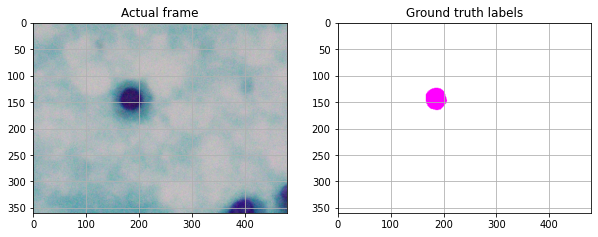

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


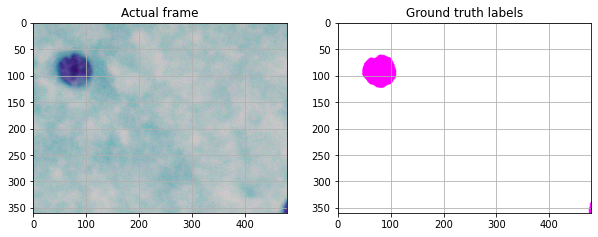

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


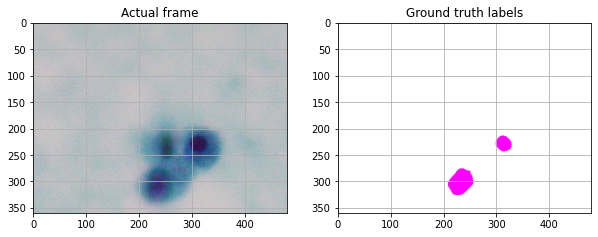

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


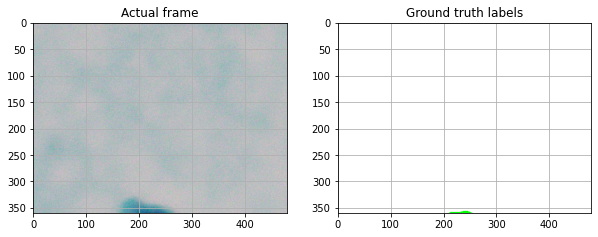

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


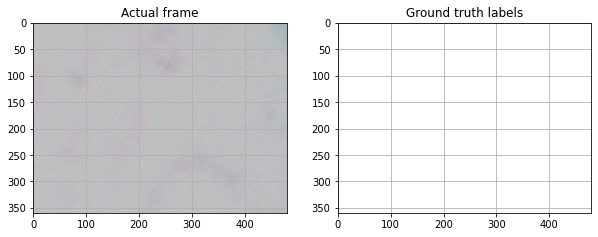

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


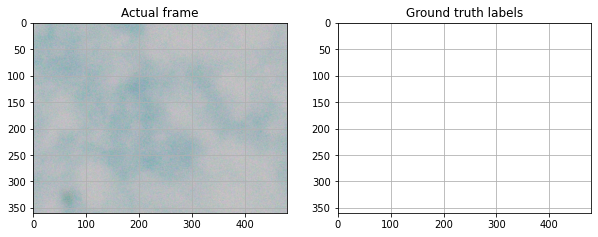

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


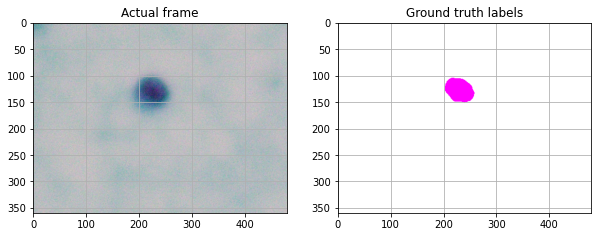

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


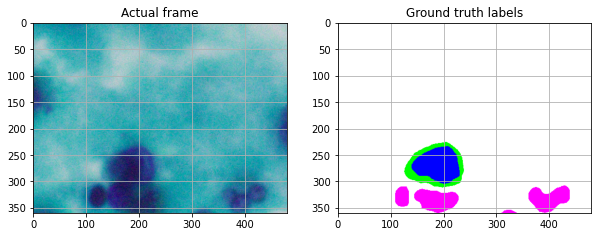

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


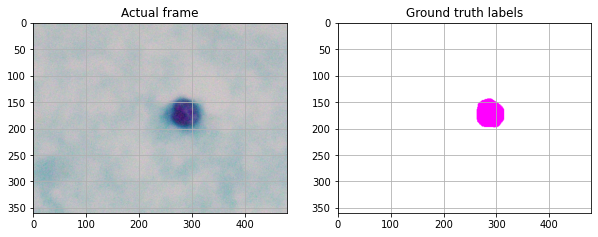

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


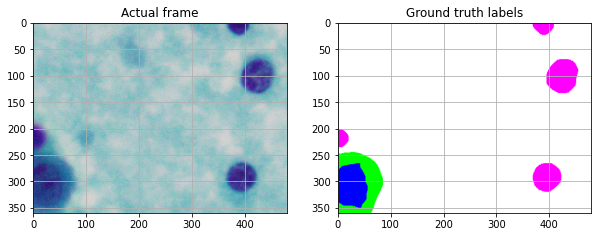

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


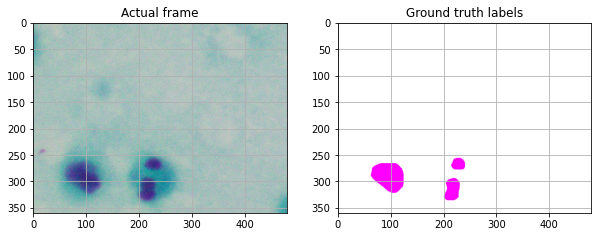

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


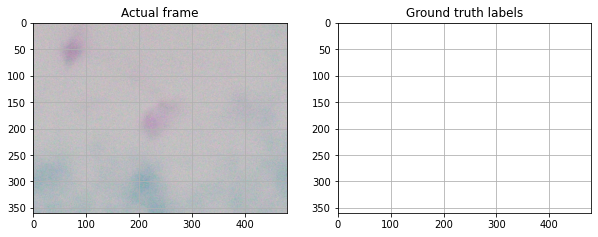

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


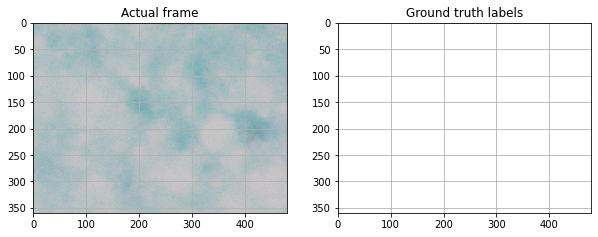

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


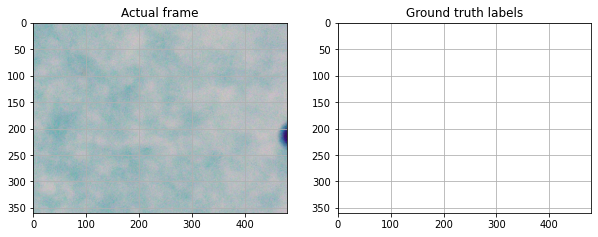

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


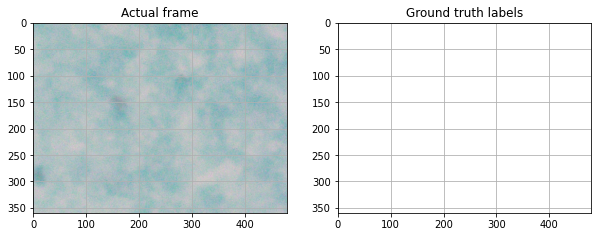

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


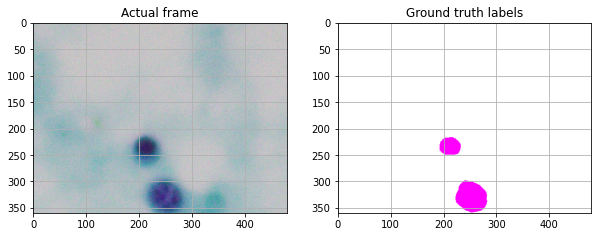

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


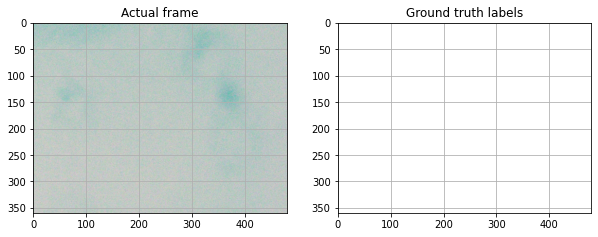

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


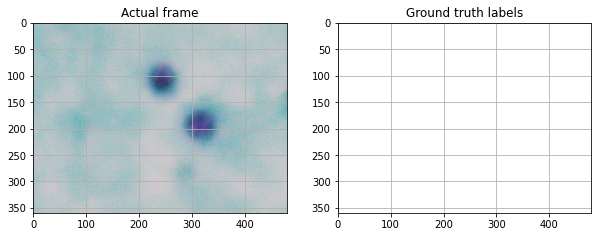

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


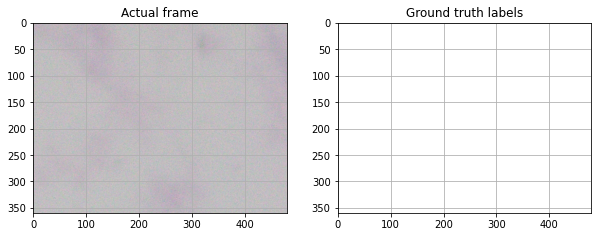

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


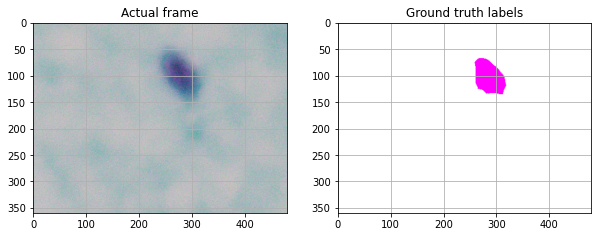

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


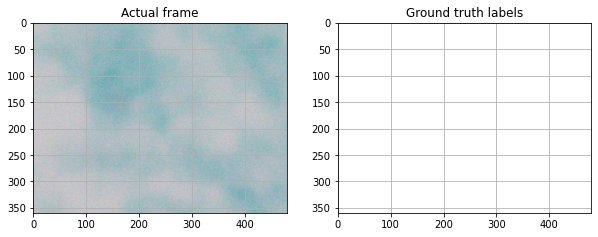

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


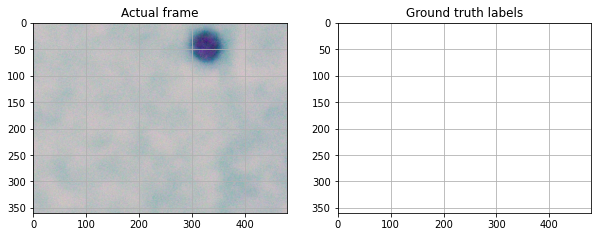

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


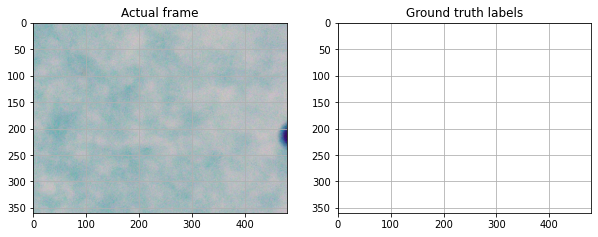

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


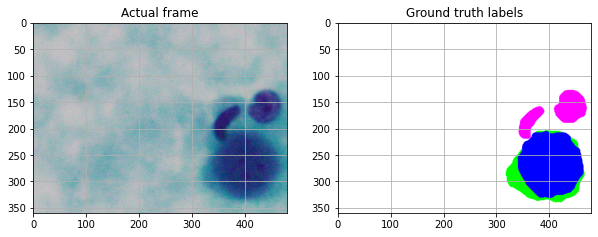

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


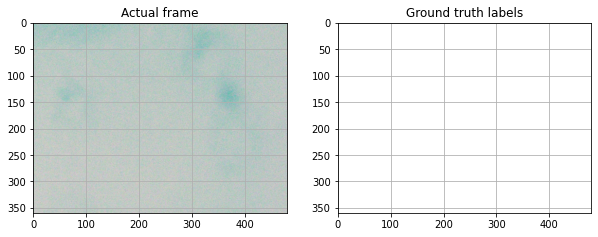

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


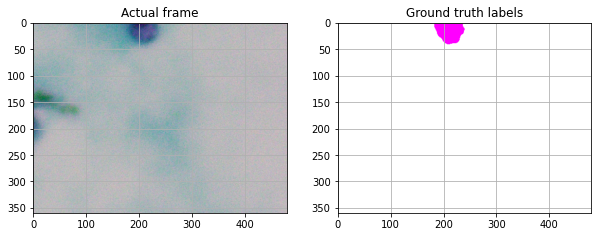

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


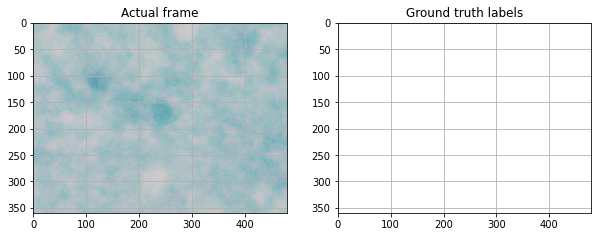

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


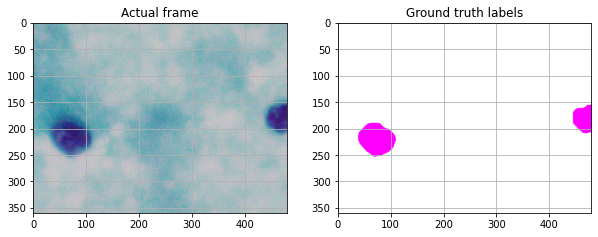

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


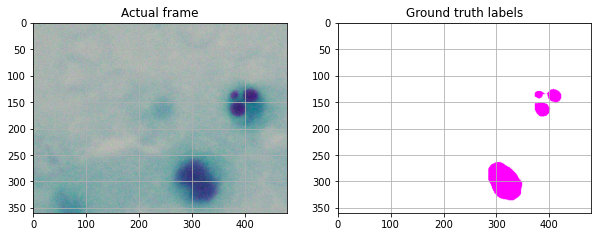

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


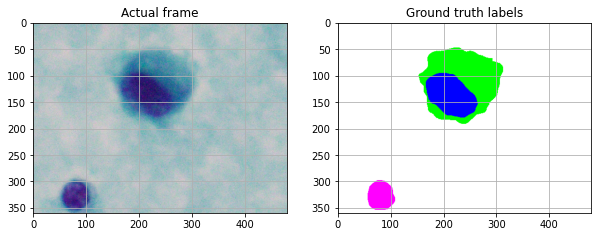

In [ ]:
for i in range(N):
    
    fig = plt.figure(figsize=(10,4))
    
    ax1 = fig.add_subplot(1,2,1)
    ax1.set_title('Actual frame')
    ax1.imshow(B_images[i]/255.0)
    ax1.grid(b=None)
        
    ax2 = fig.add_subplot(1,2,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(B_masks[i])
    ax2.grid(b=None)

    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


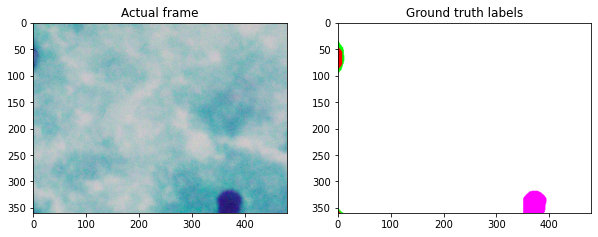

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


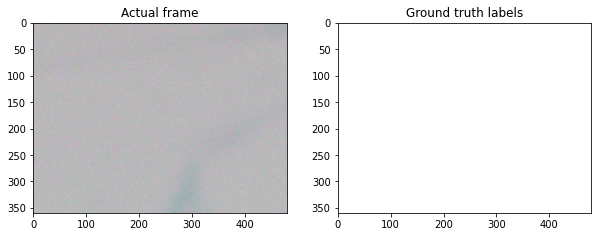

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


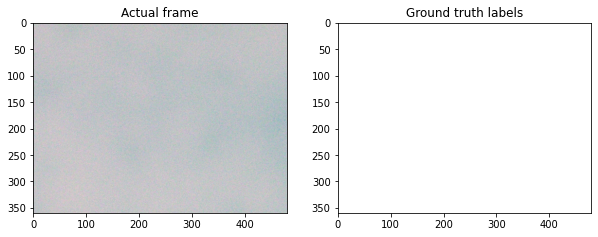

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


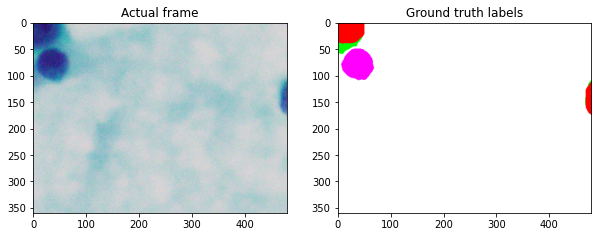

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


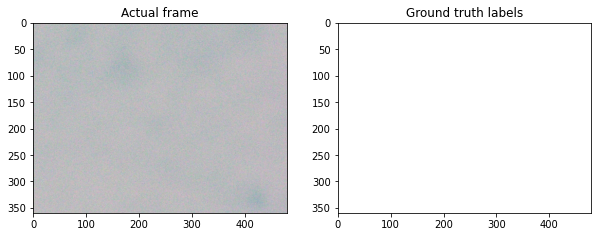

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


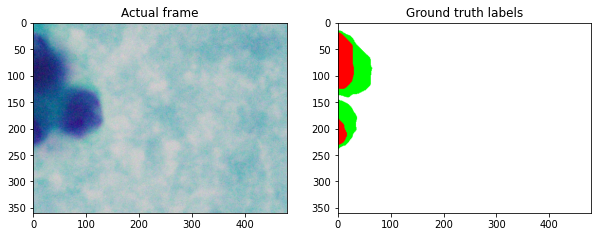

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


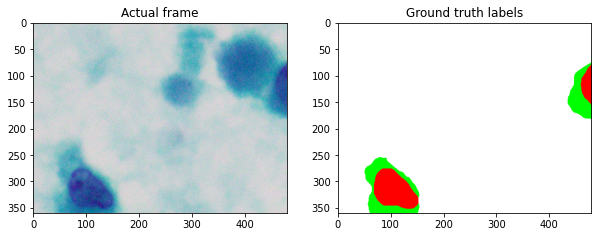

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


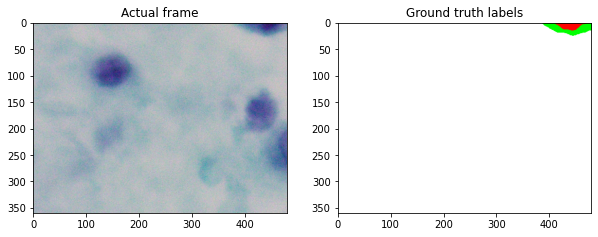

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


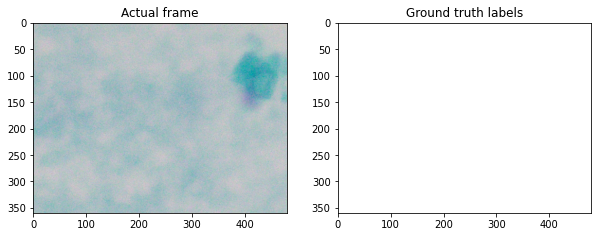

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


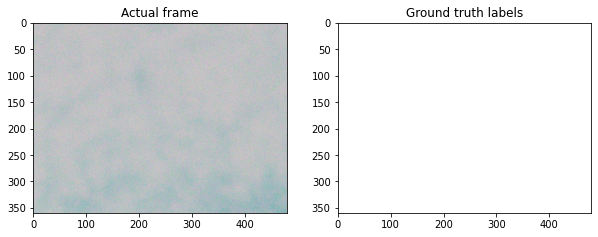

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


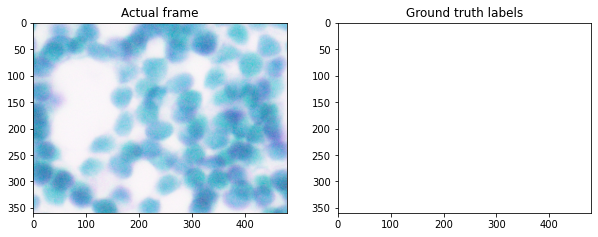

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


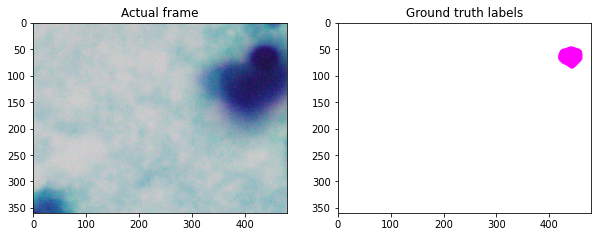

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


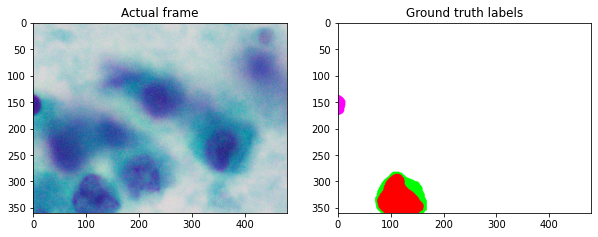

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


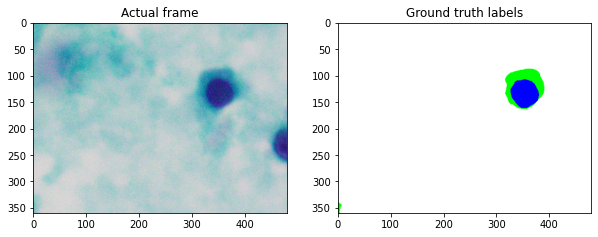

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


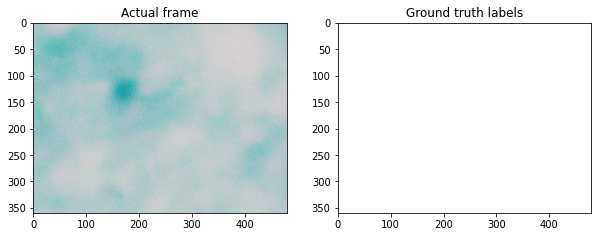

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


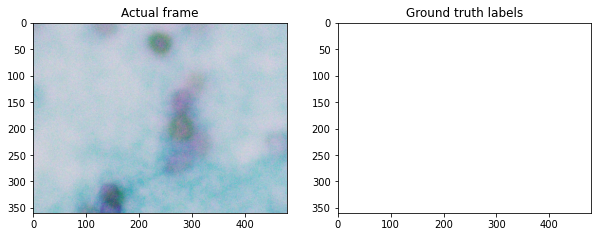

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


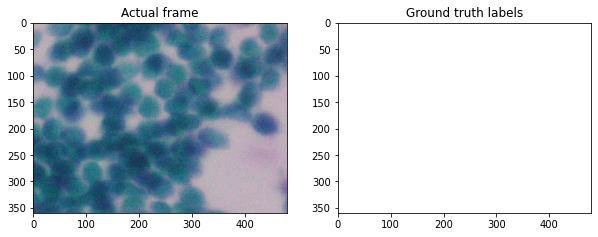

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


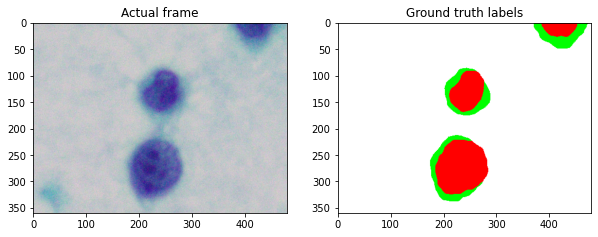

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


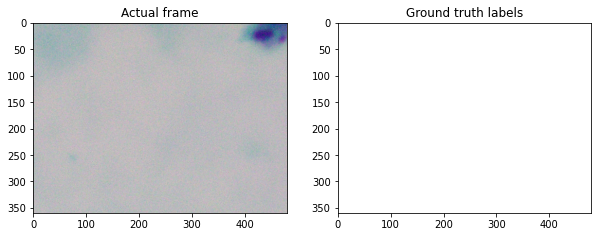

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


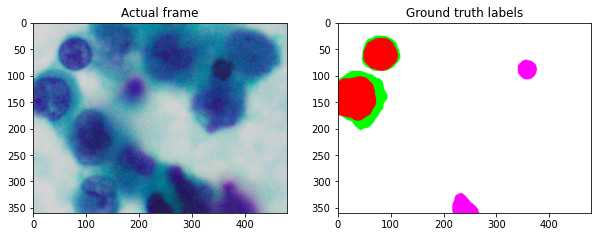

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


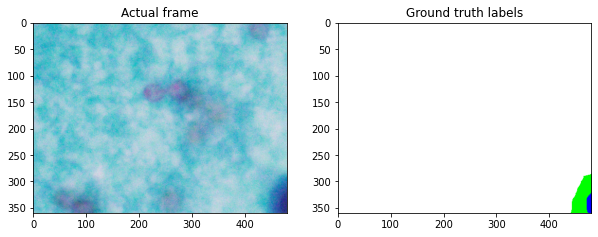

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


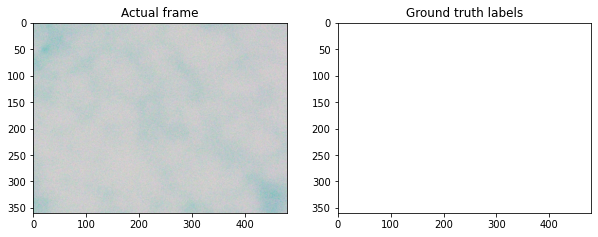

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


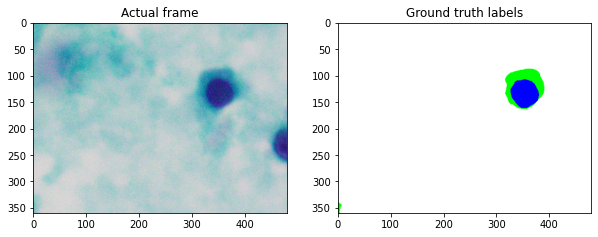

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


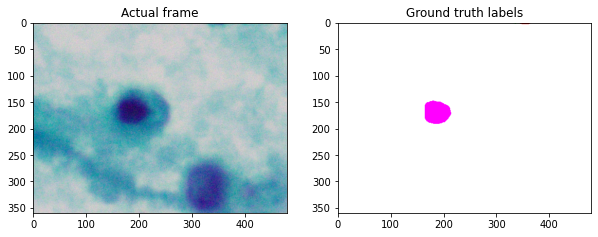

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


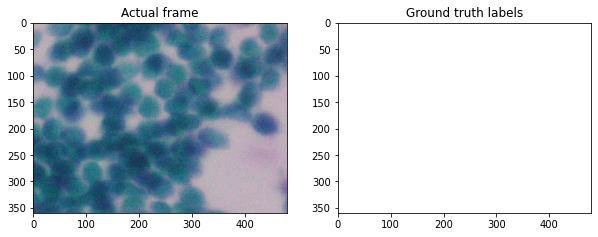

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


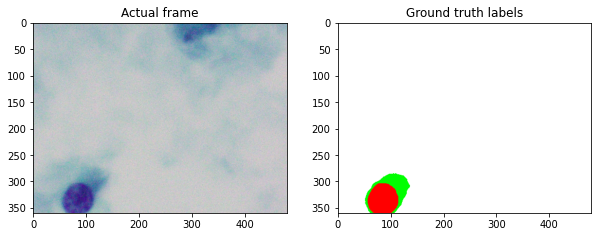

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


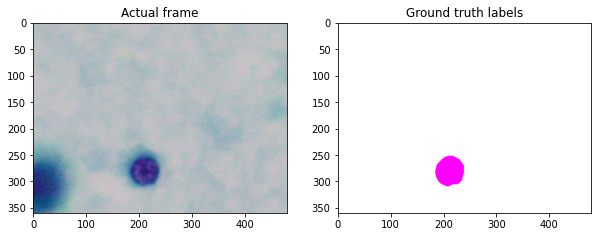

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


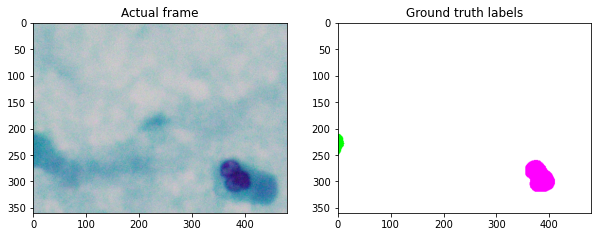

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


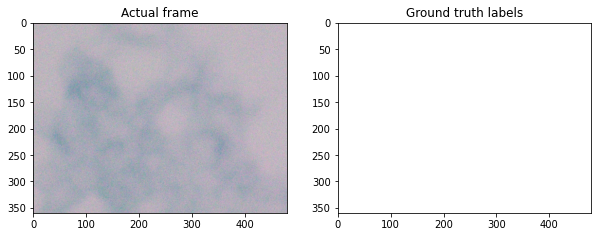

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


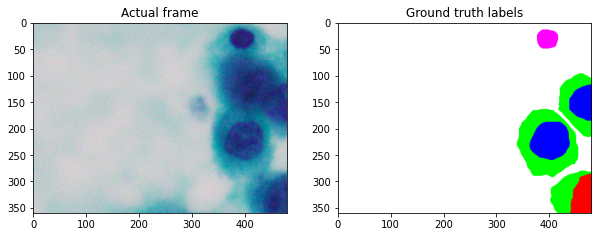

In [ ]:
for i in range(N):
    
    fig = plt.figure(figsize=(10,4))
    
    ax1 = fig.add_subplot(1,2,1)
    ax1.set_title('Actual frame')
    ax1.imshow(M_images[i]/255.0)
        
    ax2 = fig.add_subplot(1,2,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(M_masks[i])

    plt.show()

In [ ]:
B_preds= tf.nn.softmax(model.predict(B_images))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


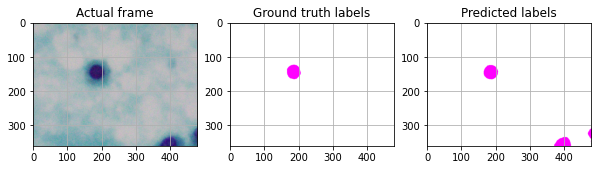

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


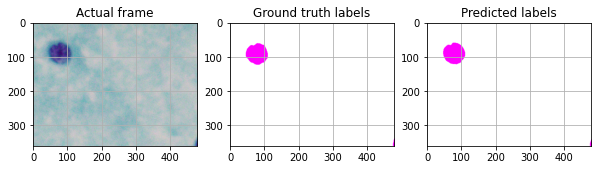

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


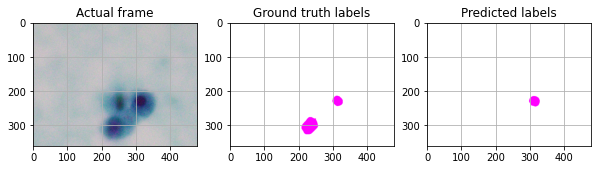

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


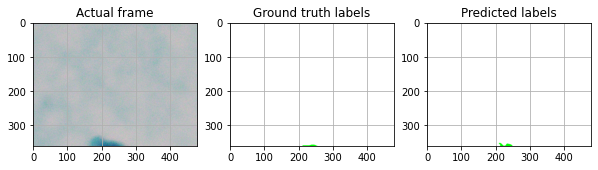

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


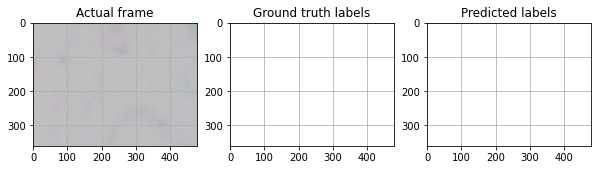

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


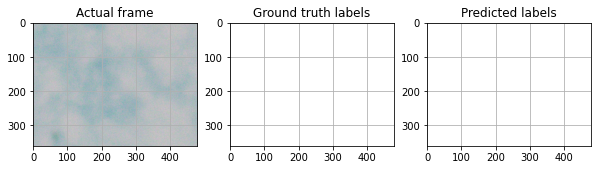

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


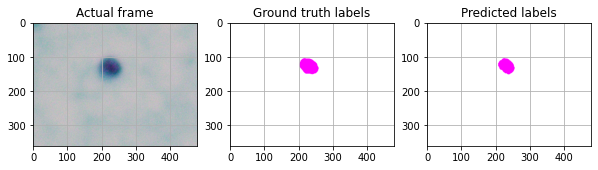

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


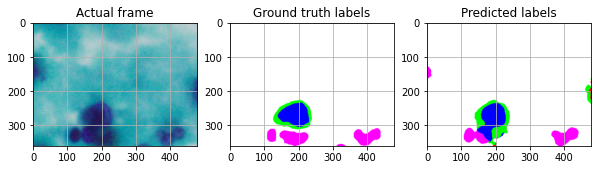

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


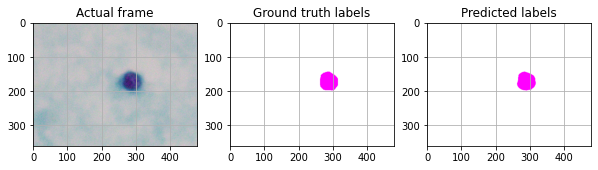

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


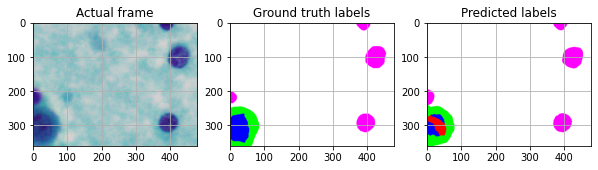

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


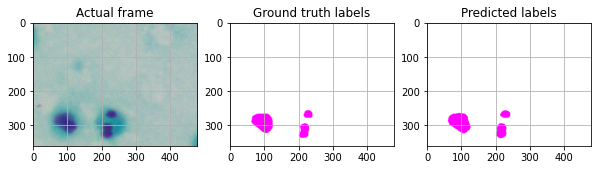

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


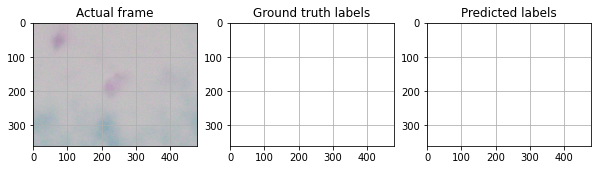

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


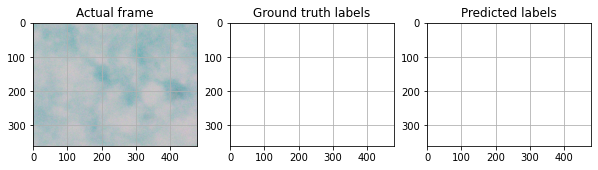

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


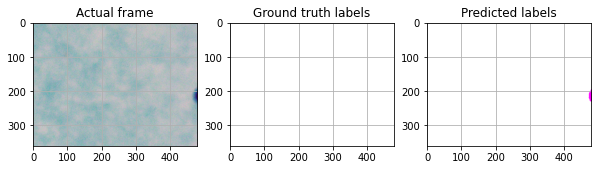

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


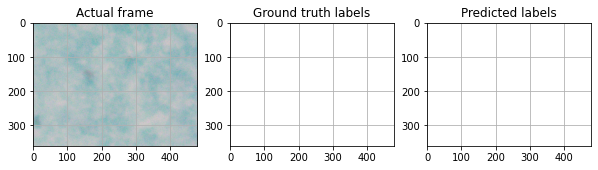

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


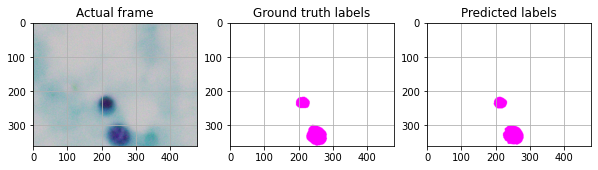

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


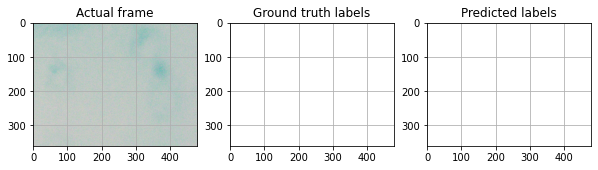

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


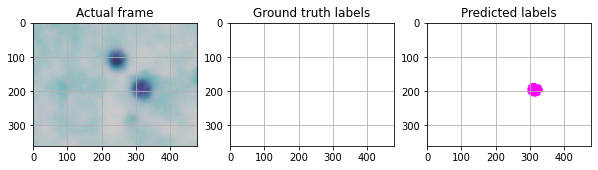

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


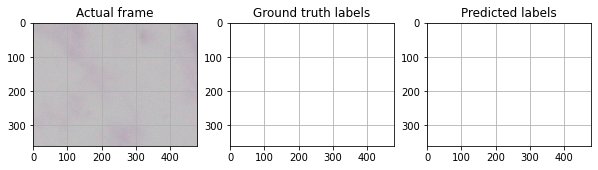

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


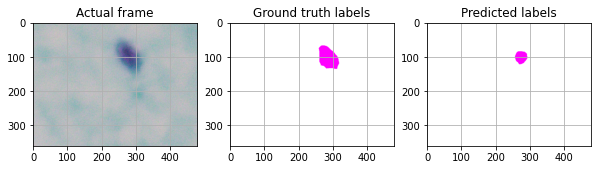

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


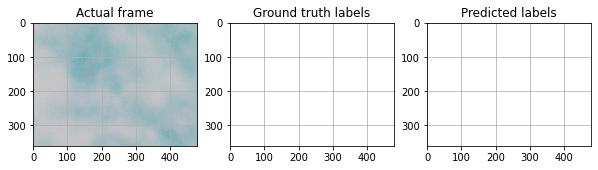

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


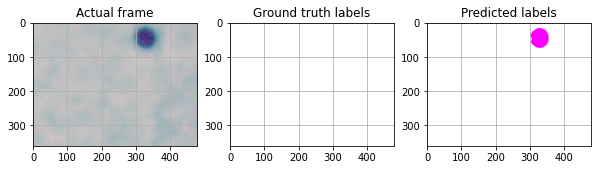

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


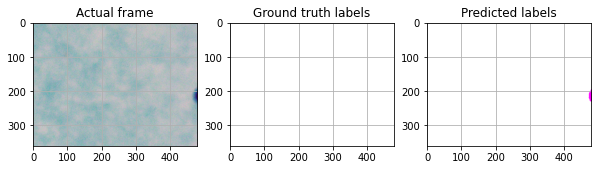

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


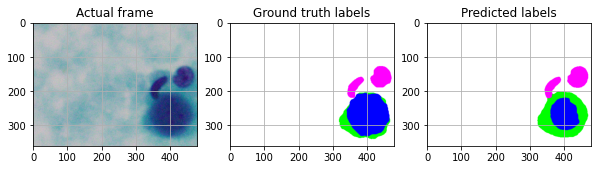

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


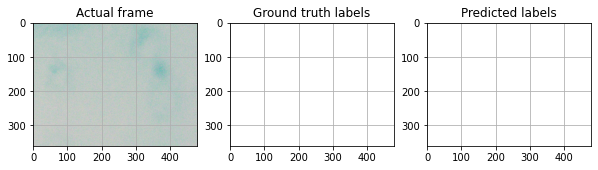

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


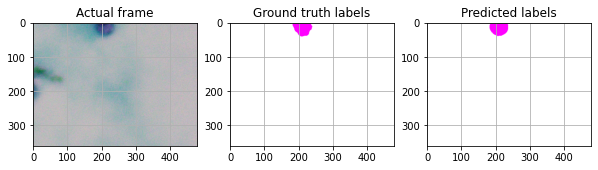

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


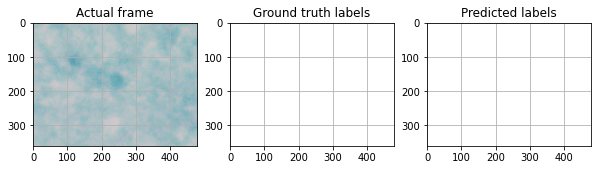

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


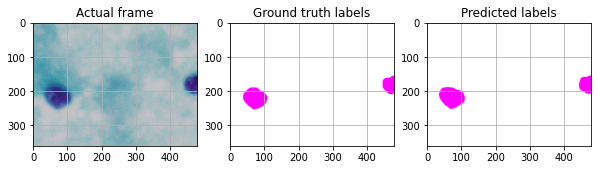

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


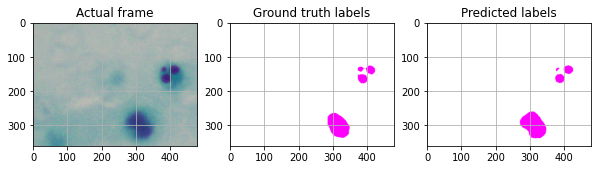

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


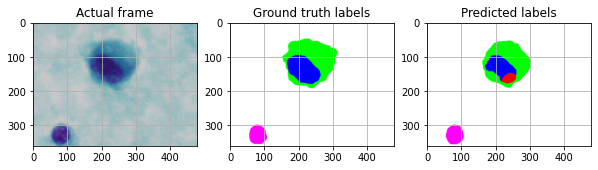

In [ ]:
for i in range(N):
    
    fig = plt.figure(figsize=(10,4))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.set_title('Actual frame')
    ax1.imshow(B_images[i]/255.0)
    ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(B_masks[i])
    ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(B_preds[i]))
    ax3.grid(b=None)
    
    plt.show()

In [ ]:
M_preds= tf.nn.softmax(model.predict(M_images))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


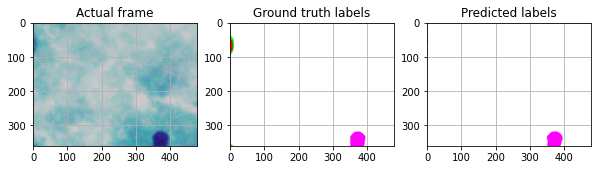

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


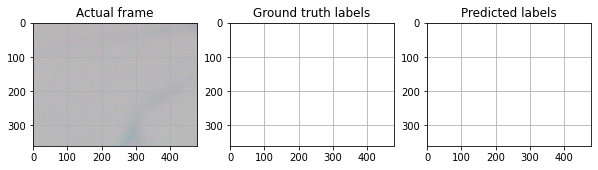

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


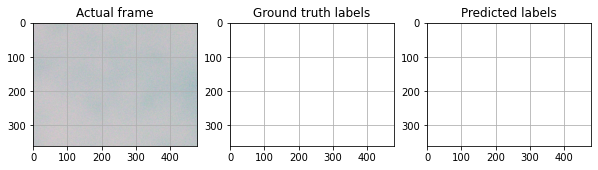

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


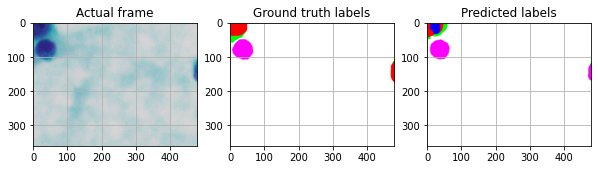

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


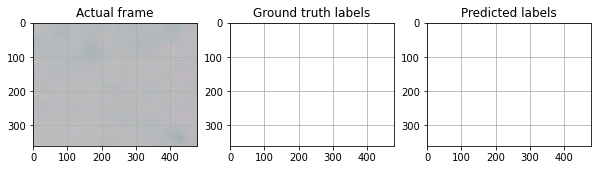

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


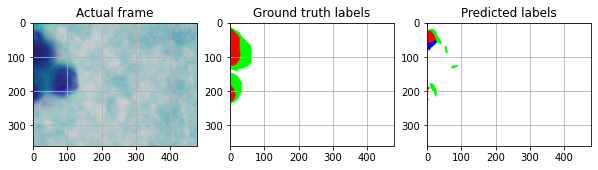

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


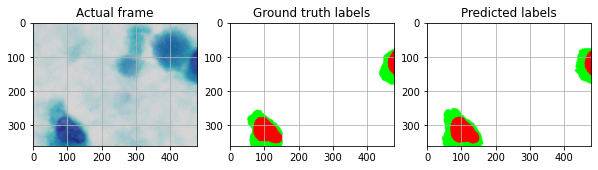

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


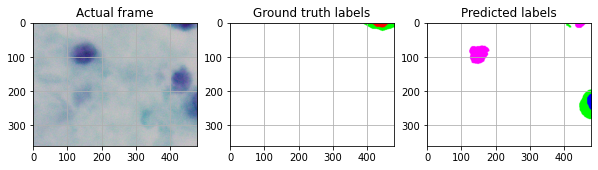

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


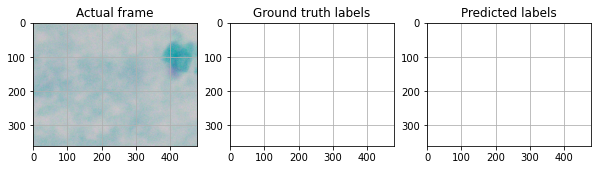

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


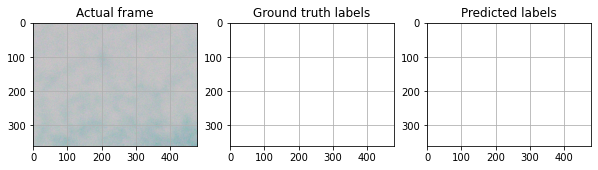

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


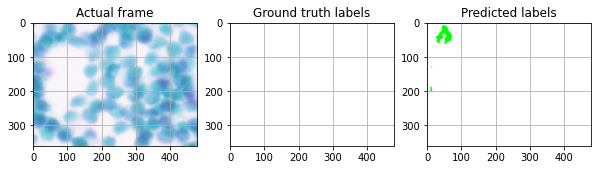

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


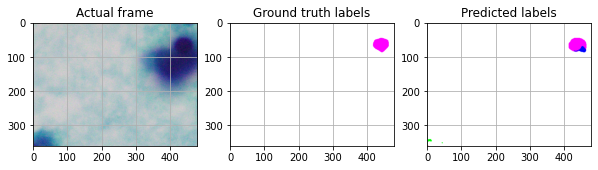

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


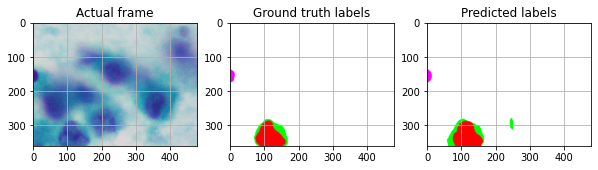

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


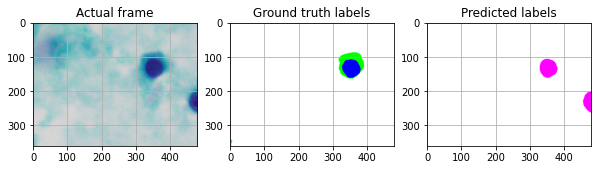

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


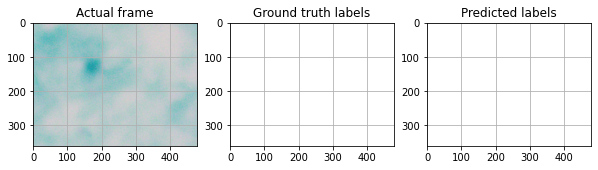

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


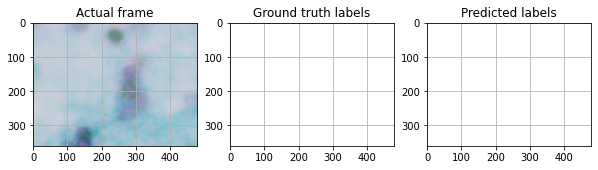

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


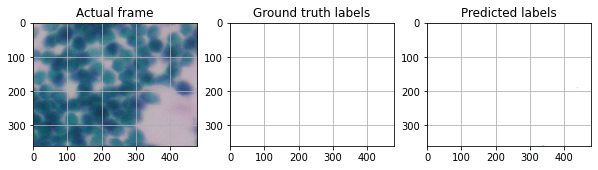

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


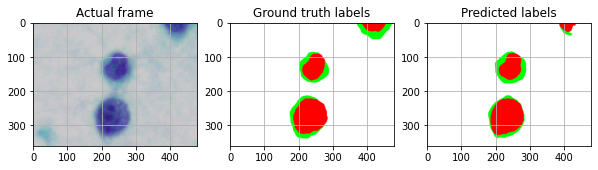

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


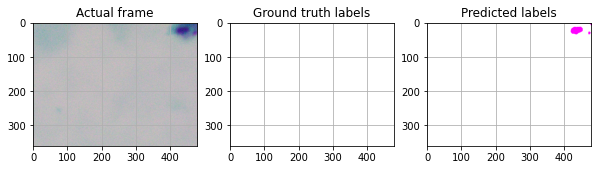

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


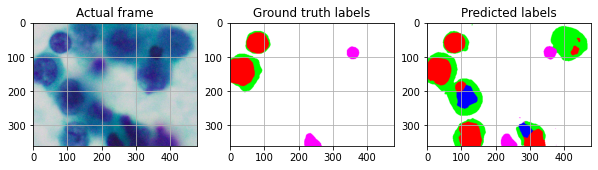

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


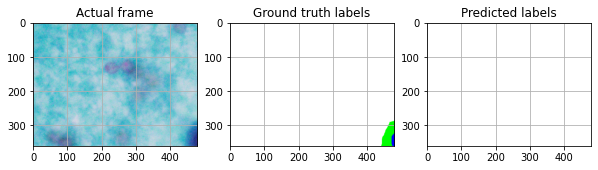

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


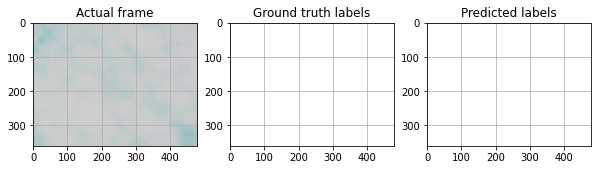

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


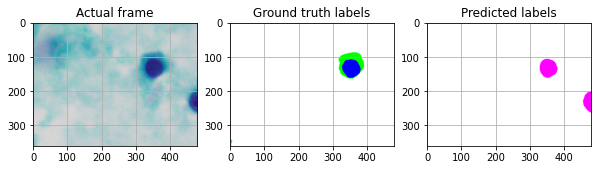

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


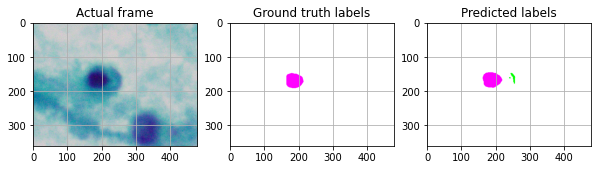

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


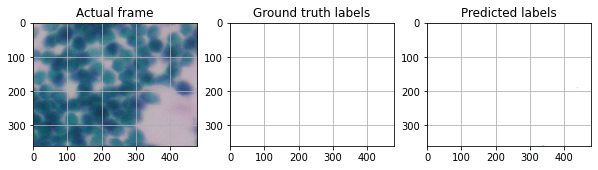

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


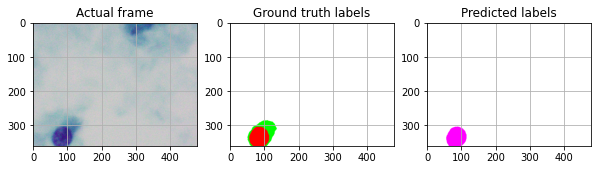

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


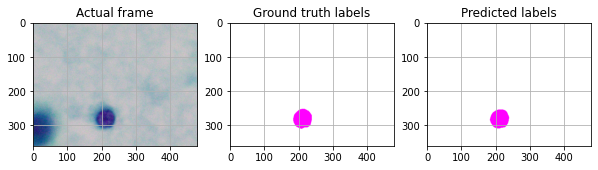

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


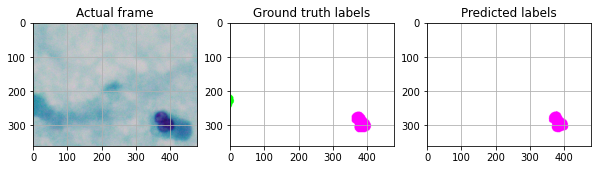

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


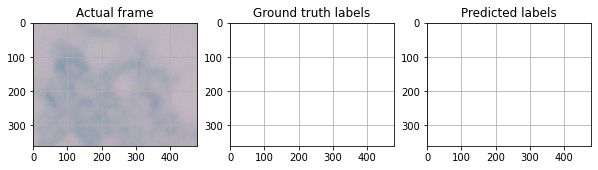

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


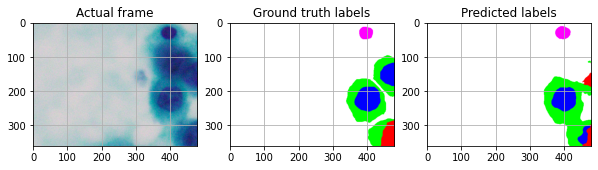

In [ ]:
for i in range(N):
    
    fig = plt.figure(figsize=(10,4))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.set_title('Actual frame')
    ax1.imshow(M_images[i]/255.0)
    ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(M_masks[i])
    ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(M_preds[i]))
    ax3.grid(b=None)
    
    plt.show()

In [ ]:
save_path= os.path.join(main_dir,'Model_Segment.hdf5')
model.save(save_path)